In [1]:
import sqlite3
import scipy.io as sio
import matplotlib.pyplot as plt
import numpy as np
import os
from enum import Enum
from skimage import data
from sklearn.metrics import accuracy_score

%matplotlib inline

In [20]:
class Participant(Enum):
     none = 0
     adult = 1
     child = 2
     pet = 3

conn = sqlite3.connect('sessions.db')
c = conn.cursor()

rows = [r for r in c.execute('SELECT * FROM readings')]
image_paths = ['image_data/{}'.format(r[5]) for r in rows]
X = [data.imread(p) for p in image_paths]
Y = [Participant[r[2]].value for r in rows]

FileNotFoundError: [Errno 2] No such file or directory: 'image_data/197398f5-a23f-4a16-bfdb-e80f834d2bf6_2016-03-19 20:02:43.649125.png'

In [3]:
X_none = [(c[0],c[2]) for c in zip(X, Y, image_paths) if c[1] == 0]
X_adult = [(c[0],c[2]) for c in zip(X, Y, image_paths) if c[1] == 1]

/usr/local/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


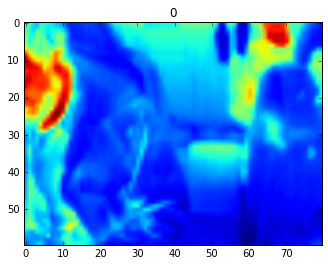

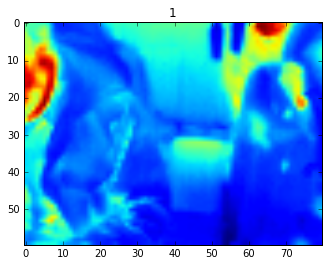

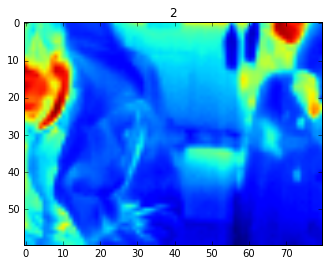

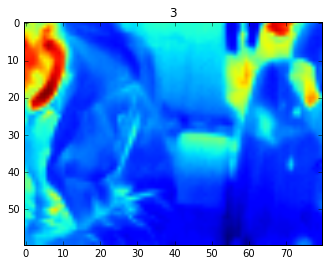

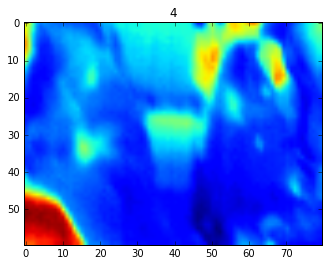

...

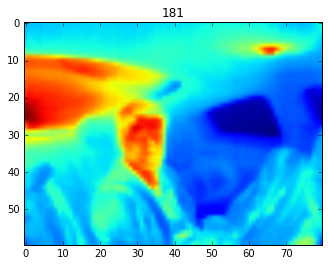

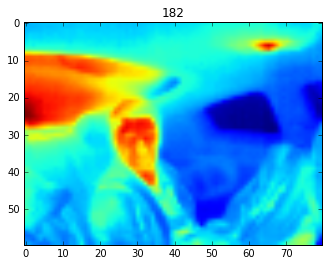

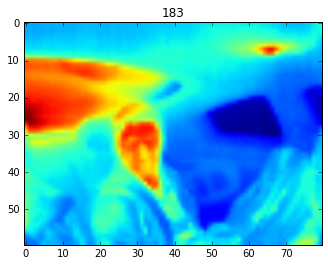

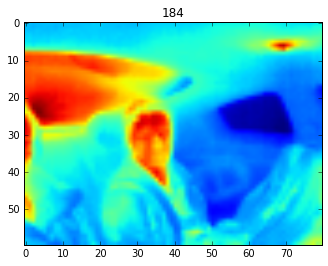

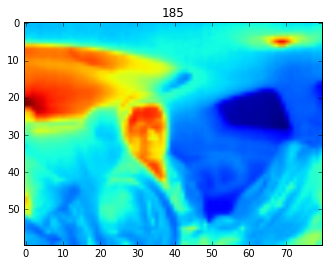

In [4]:
i = 0
for x in X_adult:
    plt.figure()
    plt.imshow(x[0])
    plt.title(i)
    i = i + 1

In [5]:
adult_image_paths = [c[2] for c in zip(X, Y, image_paths) if c[1] == 1]
delete_idx = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 35, 36, 52, 53, 54, 55, 56, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 91, 92, 93, 106, 129, 130, 150]
to_none_idx = [37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 90]

In [6]:
delete_paths = np.array(adult_image_paths)[delete_idx]
to_none_paths = np.array(adult_image_paths)[to_none_idx]

/usr/local/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


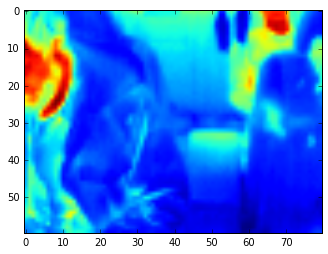

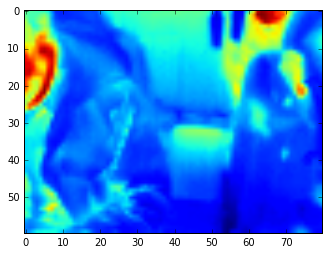

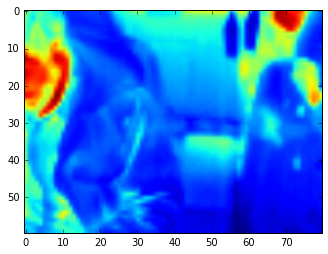

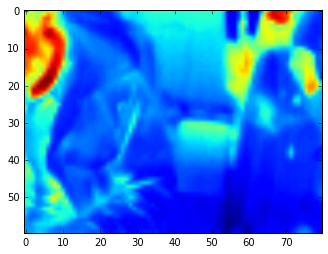

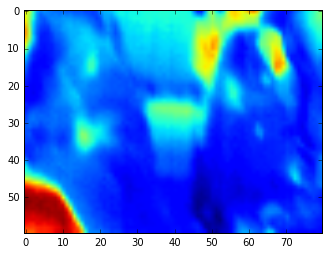

...

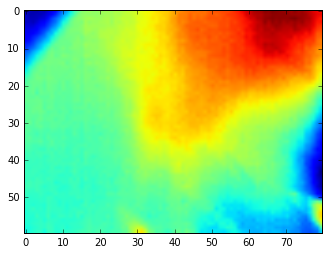

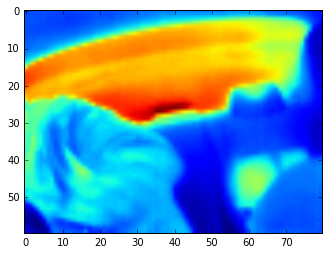

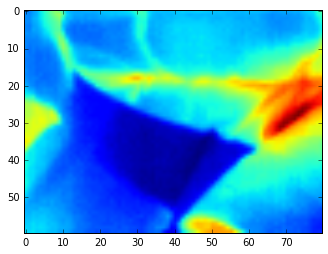

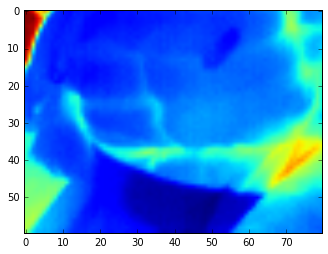

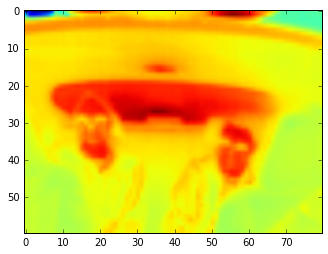

In [7]:
# Look at images one last time before deleting
for path in delete_paths:
    img = data.imread(path)
    plt.figure()
    plt.imshow(img)

/usr/local/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


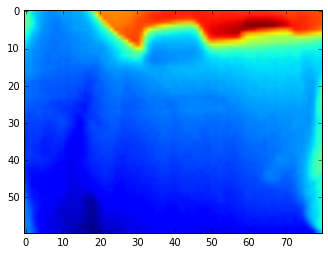

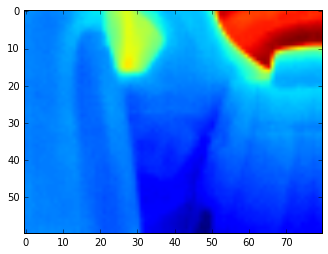

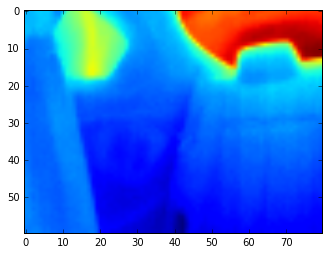

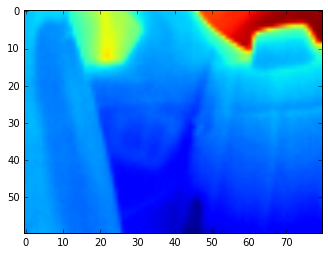

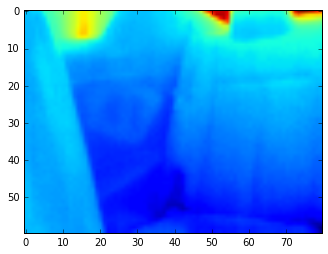

...

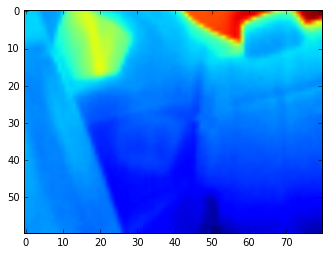

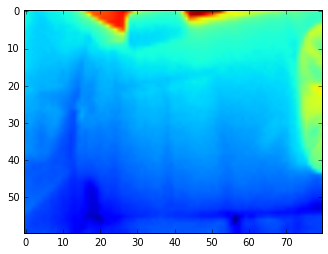

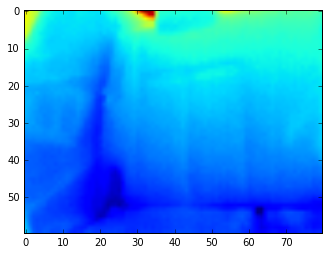

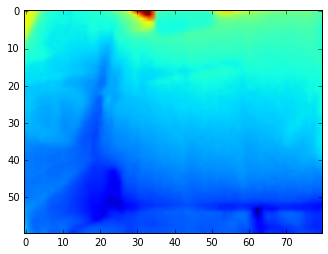

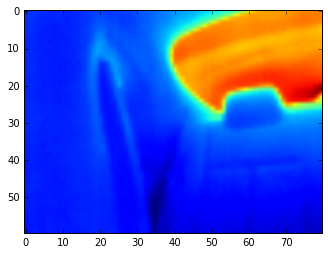

In [8]:
for path in to_none_paths:
    img = data.imread(path)
    plt.figure()
    plt.imshow(img)

In [33]:
for path in delete_paths:
    print(c.execute("DELETE FROM readings WHERE image_name=?", (path.replace('image_data/', ''),)).rowcount)
    #os.remove(path)

1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


In [34]:
for path in to_none_paths:
    print(c.execute("UPDATE readings SET subject_type = 'none' WHERE image_name = ?", (path.replace('image_data/', ''),)).rowcount)

1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


In [35]:
conn.commit()
conn.close()